In [1]:
pip install --upgrade bitsandbytes --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 14.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.4 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
import os
import sys
import subprocess
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
from diffusers import StableDiffusion3Pipeline, BitsAndBytesConfig, SD3Transformer2DModel
import nltk
from nltk.corpus import wordnet as wn
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pickle
from tqdm.auto import tqdm
import warnings
import gc

warnings.filterwarnings('ignore')
print("🚀 Librerie caricate con successo!")

2025-06-21 13:40:51.658211: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750513251.871118      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750513251.938625      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


🚀 Librerie caricate con successo!


In [4]:
def setup_huggingface_auth():
    try:
        from kaggle_secrets import UserSecretsClient
        hf_token = UserSecretsClient().get_secret("HUGGINGFACE_TOKEN")
        if hf_token:
            print("✅ Token Hugging Face trovato nei Kaggle Secrets")
            return hf_token
    except ImportError:
        print("❌ Token Hugging Face non trovato!")
    return None

def authenticate_huggingface():
    token = setup_huggingface_auth()
    if token:
        try:
            from huggingface_hub import login
            login(token=token, add_to_git_credential=False)
            print("🔐 Autenticazione Hugging Face completata!")
            return True
        except Exception as e:
            print(f"❌ Errore nell'autenticazione: {e}")
    return False

In [8]:
class ProjectConfig:
    DIFFUSION_MODEL = "stabilityai/stable-diffusion-3.5-large"
    IMAGE_SIZE = (512, 512)
    NUM_INFERENCE_STEPS = 28
    GUIDANCE_SCALE = 4.5

    CNN_MODEL = "resnet50"
    BATCH_SIZE = 16

    CORE_WORDNET_URL = "https://wordnetcode.princeton.edu/standoff-files/core-wordnet.txt"
    MAX_SYNSETS = 10
    
    TOP_K_ACTIVATIONS = 10
    TOP_K_SYNSETS_PER_LAYER = 3
    LAYER_TO_ANALYZE = "layer4"
    
    VISUALIZATION_MAX_IMAGES = 2
    REPORT_TOP_LAYERS = 8

    DATA_DIR = "/kaggle/working/cnn_interpretability_data"
    IMAGES_DIR = os.path.join(DATA_DIR, "generated_images")
    RESULTS_DIR = os.path.join(DATA_DIR, "results")

config = ProjectConfig()
os.makedirs(config.DATA_DIR, exist_ok=True)
os.makedirs(config.IMAGES_DIR, exist_ok=True)
os.makedirs(config.RESULTS_DIR, exist_ok=True)

print(f"📁 Directory di lavoro: {config.DATA_DIR}")
print(f"🔢 Max synsets: {config.MAX_SYNSETS}")

📁 Directory di lavoro: /kaggle/working/cnn_interpretability_data
🔢 Max synsets: 10


In [9]:
class CoreWordNetManager:
    
    def __init__(self, max_synsets=None):
        self.max_synsets = max_synsets
        self.core_synsets = []
        self.synset_words = {}

    def download_and_parse_core_wordnet(self):
        return self._load_curated_synsets()

    def _load_curated_synsets(self):
        curated_data = [
            ('dog.n.01', ['dog', 'domestic dog']),
            ('car.n.01', ['car', 'automobile']),
            ('tree.n.01', ['tree']),
            ('flower.n.01', ['flower', 'bloom']),
            ('computer.n.01', ['computer', 'pc']),
            ('cat.n.01', ['cat', 'domestic cat']),
            ('bird.n.01', ['bird']),
            ('chair.n.01', ['chair']),
            ('bicycle.n.01', ['bicycle', 'bike']),
            ('boat.n.01', ['boat', 'ship'])
        ]
        
        self.core_synsets = []
        self.synset_words = {}
        
        for synset_name, words in curated_data[:self.max_synsets]:
            try:
                syn = wn.synset(synset_name)
                self.core_synsets.append(syn)
                self.synset_words[syn] = words
            except Exception as e:
                print(f"⚠️ Errore caricando {synset_name}: {e}")
                continue
        
        print(f"✅ Caricati {len(self.core_synsets)} synsets")
        return True

    def get_prompts_for_generation(self):
        prompts, mapping = [], {}
        
        specific_templates = {
            'dog': "A professional photograph of a beautiful {}, sitting in a natural outdoor setting with soft natural lighting and a blurred background",
            'car': "A high-quality automotive photograph of a sleek {} on a scenic road, shot during golden hour with dramatic lighting and rich colors",
            'tree': "A majestic {} photographed in its natural environment, with detailed bark texture and lush foliage, captured in beautiful natural light",
            'flower': "A macro photograph of a delicate {} in full bloom, showing intricate petals and vivid colors with artistic composition and soft lighting",
            'computer': "A modern tech photograph of a sleek {} setup in a contemporary workspace, with clean lines and professional studio lighting",
            'cat': "A cute {} sitting on a cozy blanket in a sunlit room, with soft focus and warm colors",
            'bird': "A vibrant {} perched on a branch, with a blurred green background and natural sunlight",
            'chair': "A stylish {} in a modern living room, with elegant design and soft lighting",
            'bicycle': "A dynamic photograph of a {} leaning against a wall in an urban setting, with artistic composition",
            'boat': "A scenic shot of a {} floating on calm water at sunset, with beautiful reflections"
        }
        
        for i, syn in enumerate(self.core_synsets):
            words = self.synset_words[syn]
            main_word = words[0]
            
            template = None
            for key, temp in specific_templates.items():
                if key in main_word.lower():
                    template = temp
                    break
            
            if not template:
                template = "A professional, high-quality photograph of a {} with excellent lighting, sharp focus, and artistic composition"
            
            prompt = template.format(main_word)
            prompts.append(prompt)
            mapping[prompt] = syn
            
            print(f"🎨 Prompt {i+1}: {main_word} -> {prompt[:80]}...")
        
        return prompts, mapping

In [10]:
class StableDiffusionGenerator:
    def __init__(self, model_name=None):
        self.model_name = model_name or config.DIFFUSION_MODEL
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.pipe = None
        self.use_quantization = True

    def load_model(self):
        print(f"🔄 Caricando Stable Diffusion 3.5 Large: {self.model_name}")
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        import gc
        gc.collect()
        if self.use_quantization:
            try:
                return self._load_quantized_model()
            except Exception as e:
                print(f"⚠️ Quantizzazione fallita: {e}")
                print("🔄 Caricamento senza quantizzazione...")
                self.use_quantization = False
        return self._load_standard_model()

    def _load_quantized_model(self):
        try:
            from diffusers import BitsAndBytesConfig, SD3Transformer2DModel, StableDiffusion3Pipeline
            nf4_config = BitsAndBytesConfig(
                load_in_4bit=True,
                bnb_4bit_quant_type="nf4",
                bnb_4bit_compute_dtype=torch.bfloat16
            )
            transformer = SD3Transformer2DModel.from_pretrained(
                self.model_name,
                subfolder="transformer",
                quantization_config=nf4_config,
                torch_dtype=torch.bfloat16
            )
            self.pipe = StableDiffusion3Pipeline.from_pretrained(
                self.model_name,
                transformer=transformer,
                torch_dtype=torch.bfloat16
            )
            self.pipe.enable_model_cpu_offload()
            print("✅ SD 3.5 Large caricato con quantizzazione 4-bit!")
            return True
        except Exception as e:
            print(f"❌ Errore quantizzazione: {e}")
            raise

    def _load_standard_model(self):
        try:
            from diffusers import StableDiffusion3Pipeline
            self.pipe = StableDiffusion3Pipeline.from_pretrained(
                self.model_name,
                torch_dtype=torch.bfloat16
            )
            self.pipe.enable_model_cpu_offload()
            self.pipe.enable_attention_slicing()
            print("✅ SD 3.5 Large caricato in modalità standard!")
            return True
        except Exception as e:
            print(f"❌ Errore caricamento standard: {e}")
            raise RuntimeError(f"Impossibile caricare SD 3.5 Large: {e}")

    def generate_image(self, prompt, seed=None):
        if self.pipe is None:
            raise ValueError("Modello non caricato!")
        generator = torch.Generator(self.device).manual_seed(seed) if seed is not None else None
        with torch.autocast(self.device.type, dtype=torch.bfloat16):
            output = self.pipe(
                prompt,
                num_inference_steps=config.NUM_INFERENCE_STEPS,
                guidance_scale=config.GUIDANCE_SCALE,
                generator=generator,
                height=config.IMAGE_SIZE[0],
                width=config.IMAGE_SIZE[1]
            )
        return output.images[0]

    def generate_batch(self, prompts, save_dir=None, images_per_prompt=4):
        images = {}
        mode = "quantizzato" if self.use_quantization else "standard"
        print(f"🎨 Generando {len(prompts)*images_per_prompt} immagini con SD 3.5 Large ({mode})...")
        for i, prompt in enumerate(prompts):
            for j in range(images_per_prompt):
                try:
                    seed = np.random.randint(0, 1000000)
                    img = self.generate_image(prompt, seed=seed)
                    key = f"{prompt} [v{j+1}]"
                    images[key] = img
                    if save_dir:
                        clean = "".join(c for c in prompt[:30] if c.isalnum() or c in (" ", "_")).rstrip()
                        filename = f"image_{i:02d}_{j+1}_{clean.replace(' ', '_')}.png"
                        img.save(os.path.join(save_dir, filename))
                    print(f"✅ Generata immagine {i+1}/{len(prompts)} v{j+1}")
                except Exception as e:
                    print(f"❌ Errore generando '{prompt[:30]}...': {e}")
                    continue
                if (i * images_per_prompt + j + 1) % 3 == 0 and torch.cuda.is_available():
                    torch.cuda.empty_cache()
        print(f"✅ Generazione completata: {len(images)} immagini create")
        return images

In [11]:
class CNNActivationAnalyzer:    
    def __init__(self, model_name=None):
        self.model_name = model_name or config.CNN_MODEL
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = None
        self.activations = {}
        self.hooks = []
        
        self.transform = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    def load_model(self):
        self.model = getattr(models, self.model_name)(pretrained=True).to(self.device)
        self.model.eval()
        print(f"✅ Modello {self.model_name} caricato!")
        return True

    def register_hooks(self):
        def make_hook(name):
            def hook(module, input, output):
                if isinstance(output, torch.Tensor) and output.dim() == 4:
                    activation = output.mean(dim=[0, 2, 3])
                else:
                    activation = output.mean(dim=0)
                self.activations[name] = activation.detach().cpu().numpy()
            return hook
        
        for name, module in self.model.named_modules():
            if any(layer in name for layer in ["layer1", "layer2", "layer3", "layer4"]):
                hook = module.register_forward_hook(make_hook(name))
                self.hooks.append(hook)
        
        print(f"✅ Registrati {len(self.hooks)} hooks per l'analisi delle attivazioni")

    def process_images(self, images_dict):
        results = {}
        with torch.no_grad():
            for prompt, img in images_dict.items():
                self.activations.clear()
                tensor = self.transform(img).unsqueeze(0).to(self.device)
                _ = self.model(tensor)
                results[prompt] = dict(self.activations)     
        return results

    def analyze_activation_patterns(self, activation_results, synset_mapping):
        analysis = {}
        
        for layer_name in {layer for result in activation_results.values() for layer in result}:
            activations, prompts, synsets = [], [], []
            
            for prompt, result in activation_results.items():
                if layer_name in result:
                    activations.append(result[layer_name])
                    prompts.append(prompt)
                    synsets.append(synset_mapping.get(prompt))
            if not activations:
                continue
                
            activation_matrix = np.stack(activations)
            
            mean_activation = activation_matrix.mean(0)
            top_neurons = np.argsort(mean_activation)[-config.TOP_K_ACTIVATIONS:][::-1]
            
            neuron_correlations = {}
            for neuron_idx in top_neurons:
                synset_stats = {}
                
                for prompt, activation_val, synset in zip(prompts, activation_matrix[:, neuron_idx], synsets):
                    if synset:
                        if synset not in synset_stats:
                            synset_stats[synset] = []
                        synset_stats[synset].append(activation_val)
                
                stats = {}
                for synset, values in synset_stats.items():
                    stats[synset] = {
                        'mean': np.mean(values),
                        'std': np.std(values),
                        'count': len(values)
                    }
                
                neuron_correlations[neuron_idx] = stats
            
            analysis[layer_name] = {
                'top_neurons': top_neurons,
                'mean_activation': mean_activation,
                'correlations': neuron_correlations
            }
        
        return analysis

    def cleanup_hooks(self):
        for hook in self.hooks:
            hook.remove()
        self.hooks.clear()
        print("Hooks rimossi!")

In [ ]:
class CNNInterpretabilityProject:
    def __init__(self):
        self.wm = CoreWordNetManager(max_synsets=10)
        self.dg = StableDiffusionGenerator()
        self.ca = CNNActivationAnalyzer()
        self.prompts = []
        self.syn_map = {}
        self.imgs = {}
        self.generated_images = {}
        self.act_res = {}
        self.analysis = {}
        self.synset_layer_analysis = {}

    def setup(self):
        print("🔧 Configurazione del progetto...")
        authenticated = authenticate_huggingface()
        if not authenticated:
            print("⚠️ Continuo senza autenticazione Hugging Face")
        for corp in ['wordnet','omw-1.4']:
            try:
                nltk.data.find(f'corpora/{corp}')
            except LookupError:
                nltk.download(corp)
        if not self.wm.download_and_parse_core_wordnet():
            raise RuntimeError("Errore nel caricamento di Core WordNet")
        base_prompts, base_syn_map = self.wm.get_prompts_for_generation()
        self.prompts = []
        self.syn_map = {}
        for prompt, syn in base_syn_map.items():
            for j in range(10):
                prompt_variant = f"{prompt} [v{j+1}]"
                self.prompts.append(prompt_variant)
                self.syn_map[prompt_variant] = syn
        print(f"📝 Generati {len(self.prompts)} prompts")
        if not self.dg.load_model():
            raise RuntimeError("Errore nel caricamento di Stable Diffusion 3.5")
        if not self.ca.load_model():
            raise RuntimeError("Errore nel caricamento della CNN")
        self.ca.register_hooks()
        print("✅ Setup completato con successo!")

    def run_experiment(self, max_images=None):
        print("🧪 Avvio esperimento...")
        base_prompts = list({p.rsplit(" [v", 1)[0] for p in self.prompts})
        self.imgs = self.dg.generate_batch(
            base_prompts,
            save_dir=config.IMAGES_DIR,
            images_per_prompt=10
        )
        self.generated_images = self.imgs
        self.act_res = self.ca.process_images(self.imgs)
        self.analysis = self.ca.analyze_activation_patterns(self.act_res, self.syn_map)
        self.synset_layer_analysis = self.analyze_synset_layer_activations()
        self.save_results()
        print("✅ Esperimento completato!")
        return True

    def analyze_synset_layer_activations(self):
        print("🔬 Analizzando attivazioni per synset e layer...")
        synset_layer_data = {}
        synset_prompts = {}
        for prompt, synset in self.syn_map.items():
            if prompt in self.act_res:
                synset_name = synset.name() if hasattr(synset, 'name') else str(synset)
                if synset_name not in synset_prompts:
                    synset_prompts[synset_name] = []
                synset_prompts[synset_name].append(prompt)
        for layer_name in self.analysis:
            layer_synset_activations = {}
            for synset_name, prompts in synset_prompts.items():
                activations = []
                for prompt in prompts:
                    if prompt in self.act_res and layer_name in self.act_res[prompt]:
                        activations.append(self.act_res[prompt][layer_name])
                if activations:
                    mean_activation = np.mean(activations, axis=0)
                    layer_synset_activations[synset_name] = {
                        'mean_activation': mean_activation,
                        'max_activation': np.max(mean_activation),
                        'top_neurons': np.argsort(mean_activation)[-5:][::-1],
                        'num_images': len(activations)
                    }
            synset_layer_data[layer_name] = layer_synset_activations
        return synset_layer_data

    def get_top_synsets_per_layer(self, top_n=5):
        layer_rankings = {}
        for layer_name, synset_data in self.synset_layer_analysis.items():
            rankings = []
            for synset_name, data in synset_data.items():
                rankings.append((synset_name, data['max_activation'], data['num_images']))
            rankings.sort(key=lambda x: x[1], reverse=True)
            layer_rankings[layer_name] = rankings[:top_n]
        return layer_rankings

    def visualize_top_activating_images(self, layer_name, synset_name, max_images=3):
        relevant_prompts = [p for p, s in self.syn_map.items() 
                          if (hasattr(s, 'name') and s.name() == synset_name) or str(s) == synset_name]
        if not relevant_prompts:
            print(f"❌ Nessun prompt trovato per synset {synset_name}")
            return
        prompt_activations = []
        for prompt in relevant_prompts:
            if prompt in self.act_res and layer_name in self.act_res[prompt]:
                max_act = np.max(self.act_res[prompt][layer_name])
                prompt_activations.append((prompt, max_act))
        prompt_activations.sort(key=lambda x: x[1], reverse=True)
        top_prompts = prompt_activations[:max_images]
        if not top_prompts:
            print(f"❌ Nessuna attivazione trovata per {synset_name} nel layer {layer_name}")
            return
        fig, axes = plt.subplots(1, len(top_prompts), figsize=(5*len(top_prompts), 5))
        if len(top_prompts) == 1:
            axes = [axes]
        for i, (prompt, activation) in enumerate(top_prompts):
            if prompt in self.generated_images:
                img = self.generated_images[prompt]
                axes[i].imshow(np.array(img))
                axes[i].set_title(f"{prompt[:40]}...\nActivation: {activation:.4f}")
                axes[i].axis('off')
        plt.suptitle(f"Top immagini per {synset_name} nel layer {layer_name}")
        plt.tight_layout()
        plt.show()

    def generate_comprehensive_report(self):
        print("Report Finale")
        print("=" * 60)
        print(f"Synset utilizzati: {len(self.wm.core_synsets)}")
        print(f"Prompts generati: {len(self.prompts)}")
        print(f"Immagini create: {len(self.generated_images)}")
        print(f"Layer analizzati: {len(self.analysis)}")
        print("\n🏆 Top 3 Synset per Layer (ordinati per attivazione massima):")
        print("-" * 60)
        layer_rankings = self.get_top_synsets_per_layer(3)
        for layer_name, rankings in list(layer_rankings.items())[:10]:
            print(f"\n{layer_name}:")
            for i, (synset_name, max_act, num_imgs) in enumerate(rankings, 1):
                print(f"  {i}. {synset_name}: {max_act:.4f} (da {num_imgs} immagini)")
        print("\n🔬 Interpretazione Qualitativa:")
        print("-" * 60)
        significant_layers = list(layer_rankings.keys())[:3]
        for layer_name in significant_layers:
            top_synsets = [s[0] for s in layer_rankings[layer_name]]
            print(f"\n{layer_name} sembra specializzato in:")
            for synset in top_synsets:
                print(f"  • {synset}")

    def save_results(self):
        print("💾 Salvando risultati…")
        with open(os.path.join(config.RESULTS_DIR, 'mapping.pkl'), 'wb') as f:
            pickle.dump({k: v.name() for k, v in self.syn_map.items()}, f)
        def make_serializable(obj):
            if isinstance(obj, np.ndarray):
                return obj.tolist()
            if isinstance(obj, (np.float32, np.float64)):
                return float(obj)
            if isinstance(obj, (np.int32, np.int64)):
                return int(obj)
            if hasattr(obj, "name") and "wordnet" in str(type(obj)).lower():
                return obj.name()
            if isinstance(obj, dict):
                return {make_serializable(k): make_serializable(v) for k, v in obj.items()}
            if isinstance(obj, list):
                return [make_serializable(v) for v in obj]
            if isinstance(obj, tuple):
                return tuple(make_serializable(v) for v in obj)
            return obj if isinstance(obj, (str, float, int, bool, type(None))) else str(obj)
        serializable_analysis = make_serializable(self.analysis)
        serializable_synset_layer = make_serializable(self.synset_layer_analysis)
        with open(os.path.join(config.RESULTS_DIR, 'analysis.pkl'), 'wb') as f:
            pickle.dump(serializable_analysis, f)
        with open(os.path.join(config.RESULTS_DIR, 'synset_layer_analysis.pkl'), 'wb') as f:
            pickle.dump(serializable_synset_layer, f)
        print("✅ Risultati salvati!")

    def visualize_generated_images(self, max_images=20):
        if not self.generated_images:
            print("❌ Nessuna immagine da visualizzare")
            return
        items = list(self.generated_images.items())[:max_images]
        cols = 4
        rows = (len(items) + cols - 1) // cols
        fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
        if rows == 1:
            axes = axes.reshape(1, -1)
        for i, (prompt, img) in enumerate(items):
            row, col = i // cols, i % cols
            img_array = np.array(img.convert('RGB'))
            if img_array.max() <= 1.0:
                img_array = (img_array * 255).astype('uint8')
            axes[row, col].imshow(img_array)
            axes[row, col].axis('off')
            axes[row, col].set_title(prompt[:60] + '...' if len(prompt) > 60 else prompt, fontsize=9)
        for i in range(len(items), rows * cols):
            row, col = i // cols, i % cols
            axes[row, col].axis('off')
        plt.tight_layout()
        plt.show()

    def get_top_activated_synsets(self, top_n=10):
        synset_activations = {}
        for layer_data in self.analysis.values():
            for neuron_correlations in layer_data['correlations'].values():
                for synset, stats in neuron_correlations.items():
                    synset_name = synset if isinstance(synset, str) else getattr(synset, "name", lambda: str(synset))()
                    if synset_name not in synset_activations:
                        synset_activations[synset_name] = []
                    synset_activations[synset_name].append(stats['mean'])
        synset_means = {
            synset: np.mean(activations) 
            for synset, activations in synset_activations.items()
        }
        return sorted(synset_means.items(), key=lambda x: x[1], reverse=True)[:top_n]

    def generate_report(self):
        self.generate_comprehensive_report()

    def quantitative_evaluation(self):
        print("\n📊 Valutazione quantitativa delle attivazioni:")
        results = {}
        for layer_name in self.analysis:
            synset_vectors = {}
            for prompt, synset in self.syn_map.items():
                if prompt in self.act_res and layer_name in self.act_res[prompt]:
                    synset_name = synset.name() if hasattr(synset, 'name') else str(synset)
                    if synset_name not in synset_vectors:
                        synset_vectors[synset_name] = []
                    synset_vectors[synset_name].append(self.act_res[prompt][layer_name])
            synset_means = {k: np.mean(v, axis=0) for k, v in synset_vectors.items() if len(v) > 0}
            synset_names = list(synset_means.keys())
            dists = []
            for i in range(len(synset_names)):
                for j in range(i+1, len(synset_names)):
                    dist = np.linalg.norm(synset_means[synset_names[i]] - synset_means[synset_names[j]])
                    dists.append(dist)
            avg_dist = np.mean(dists) if dists else 0
            print(f"Layer {layer_name}: {len(synset_names)} synset, distanza media tra centroidi = {avg_dist:.4f}")
            results[layer_name] = {
                "num_synsets": len(synset_names),
                "avg_centroid_distance": avg_dist
            }
        return results

    def cleanup(self):
        self.ca.cleanup_hooks()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        print("Cleanup completato")

🔧 Configurazione del progetto...
✅ Token Hugging Face trovato nei Kaggle Secrets
🔐 Autenticazione Hugging Face completata!


[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...


✅ Caricati 10 synsets
🎨 Prompt 1: dog -> A professional photograph of a beautiful dog, sitting in a natural outdoor setti...
🎨 Prompt 2: car -> A high-quality automotive photograph of a sleek car on a scenic road, shot durin...
🎨 Prompt 3: tree -> A majestic tree photographed in its natural environment, with detailed bark text...
🎨 Prompt 4: flower -> A macro photograph of a delicate flower in full bloom, showing intricate petals ...
🎨 Prompt 5: computer -> A modern tech photograph of a sleek computer setup in a contemporary workspace, ...
🎨 Prompt 6: cat -> A cute cat sitting on a cozy blanket in a sunlit room, with soft focus and warm ...
🎨 Prompt 7: bird -> A vibrant bird perched on a branch, with a blurred green background and natural ...
🎨 Prompt 8: chair -> A stylish chair in a modern living room, with elegant design and soft lighting...
🎨 Prompt 9: bicycle -> A dynamic photograph of a bicycle leaning against a wall in an urban setting, wi...
🎨 Prompt 10: boat -> A scenic shot of

config.json:   0%|          | 0.00/397 [00:00<?, ?B/s]

(…)ion_pytorch_model.safetensors.index.json:   0%|          | 0.00/127k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

(…)pytorch_model-00001-of-00002.safetensors:   0%|          | 0.00/9.99G [00:00<?, ?B/s]

(…)pytorch_model-00002-of-00002.safetensors:   0%|          | 0.00/6.31G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/706 [00:00<?, ?B/s]

Fetching 24 files:   0%|          | 0/24 [00:00<?, ?it/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/4.53G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/247M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/740 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/574 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/588 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/705 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/576 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/856 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/809 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/168M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/9 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

✅ SD 3.5 Large caricato con quantizzazione 4-bit!


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 175MB/s]


✅ Modello resnet50 caricato!
✅ Registrati 144 hooks per l'analisi delle attivazioni
✅ Setup completato con successo!

🎨 Prompt dettagliati che verranno usati:
1. A professional photograph of a beautiful dog, sitting in a natural outdoor setting with soft natural lighting and a blurred background [v1]
2. A professional photograph of a beautiful dog, sitting in a natural outdoor setting with soft natural lighting and a blurred background [v2]
3. A professional photograph of a beautiful dog, sitting in a natural outdoor setting with soft natural lighting and a blurred background [v3]
4. A professional photograph of a beautiful dog, sitting in a natural outdoor setting with soft natural lighting and a blurred background [v4]
5. A professional photograph of a beautiful dog, sitting in a natural outdoor setting with soft natural lighting and a blurred background [v5]
6. A professional photograph of a beautiful dog, sitting in a natural outdoor setting with soft natural lighting and a blurred

  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 1/10 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 1/10 v2


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 1/10 v3


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 1/10 v4


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 1/10 v5


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 1/10 v6


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 1/10 v7


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 1/10 v8


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 1/10 v9


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 1/10 v10


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 2/10 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 2/10 v2


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 2/10 v3


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 2/10 v4


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 2/10 v5


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 2/10 v6


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 2/10 v7


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 2/10 v8


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 2/10 v9


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 2/10 v10


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 3/10 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 3/10 v2


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 3/10 v3


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 3/10 v4


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 3/10 v5


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 3/10 v6


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 3/10 v7


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 3/10 v8


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 3/10 v9


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 3/10 v10


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 4/10 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 4/10 v2


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 4/10 v3


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 4/10 v4


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 4/10 v5


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 4/10 v6


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 4/10 v7


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 4/10 v8


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 4/10 v9


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 4/10 v10


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 5/10 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 5/10 v2


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 5/10 v3


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 5/10 v4


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 5/10 v5


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 5/10 v6


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 5/10 v7


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 5/10 v8


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 5/10 v9


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 5/10 v10


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 6/10 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 6/10 v2


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 6/10 v3


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 6/10 v4


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 6/10 v5


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 6/10 v6


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 6/10 v7


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 6/10 v8


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 6/10 v9


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 6/10 v10


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 7/10 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 7/10 v2


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 7/10 v3


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 7/10 v4


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 7/10 v5


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 7/10 v6


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 7/10 v7


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 7/10 v8


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 7/10 v9


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 7/10 v10


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 8/10 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 8/10 v2


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 8/10 v3


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 8/10 v4


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 8/10 v5


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 8/10 v6


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 8/10 v7


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 8/10 v8


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 8/10 v9


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 8/10 v10


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 9/10 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 9/10 v2


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 9/10 v3


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 9/10 v4


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 9/10 v5


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 9/10 v6


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 9/10 v7


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 9/10 v8


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 9/10 v9


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 9/10 v10


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 10/10 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 10/10 v2


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 10/10 v3


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 10/10 v4


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 10/10 v5


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 10/10 v6


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 10/10 v7


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 10/10 v8


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 10/10 v9


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 10/10 v10
✅ Generazione completata: 100 immagini create
🔬 Analizzando attivazioni per synset e layer...
💾 Salvando risultati…
✅ Risultati salvati!
✅ Esperimento completato!


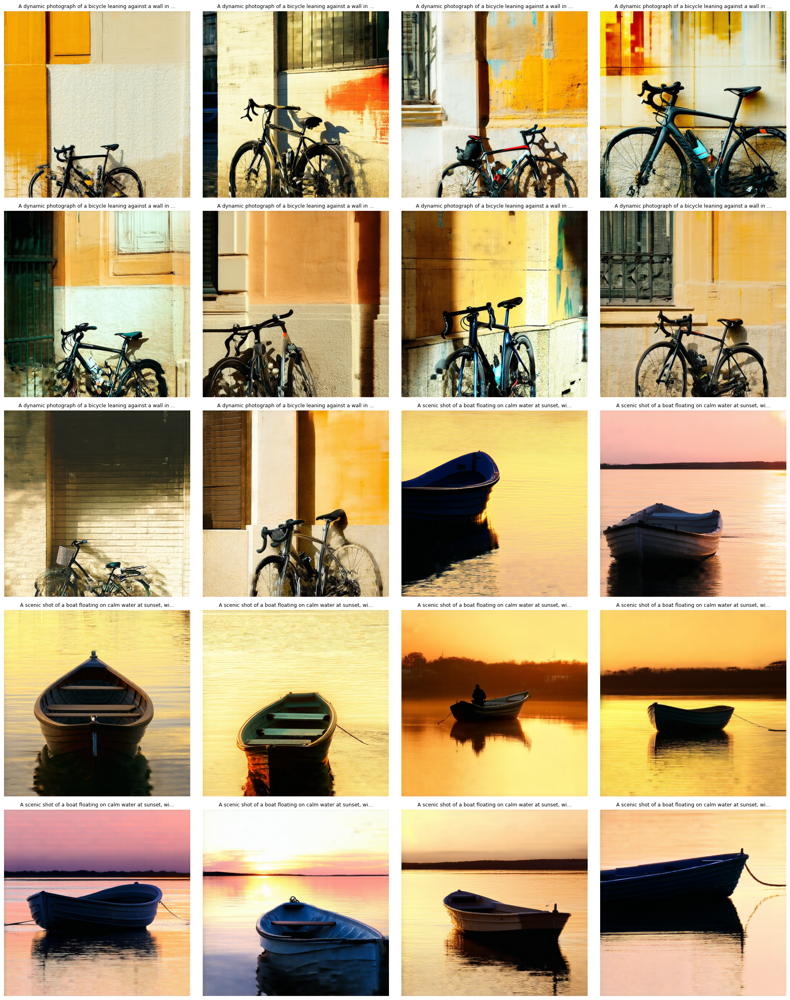

Report Finale
Synset utilizzati: 10
Prompts generati: 100
Immagini create: 100
Layer analizzati: 144

🏆 Top 3 Synset per Layer (ordinati per attivazione massima):
------------------------------------------------------------

layer3.3:
  1. computer.n.01: 0.4060 (da 10 immagini)
  2. dog.n.01: 0.3881 (da 10 immagini)
  3. flower.n.01: 0.3645 (da 10 immagini)

layer4.0.bn1:
  1. dog.n.01: 0.1840 (da 10 immagini)
  2. cat.n.01: 0.1813 (da 10 immagini)
  3. flower.n.01: 0.1747 (da 10 immagini)

layer4.1.relu:
  1. tree.n.01: 2.5172 (da 10 immagini)
  2. boat.n.01: 2.3055 (da 10 immagini)
  3. flower.n.01: 2.1233 (da 10 immagini)

layer2.1.bn3:
  1. tree.n.01: 0.2985 (da 10 immagini)
  2. flower.n.01: 0.2932 (da 10 immagini)
  3. bicycle.n.01: 0.2736 (da 10 immagini)

layer4.0.relu:
  1. flower.n.01: 1.6804 (da 10 immagini)
  2. boat.n.01: 1.6279 (da 10 immagini)
  3. computer.n.01: 1.3162 (da 10 immagini)

layer3.5.conv3:
  1. dog.n.01: 0.1595 (da 10 immagini)
  2. bird.n.01: 0.1476 (da 10

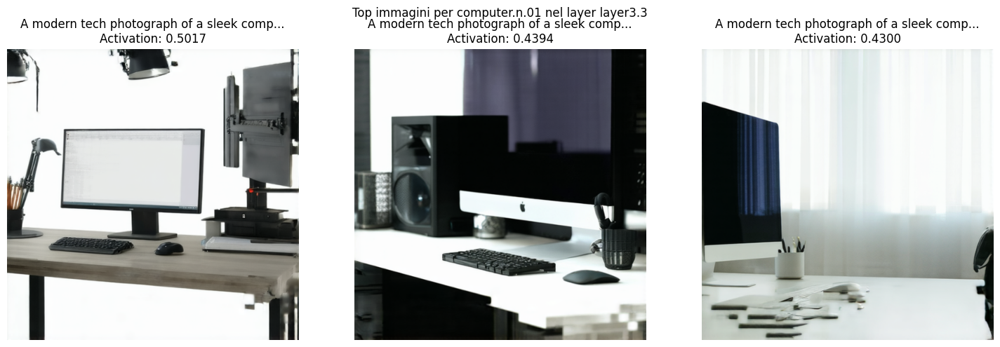


🔍 Analisi: layer3.3 – Synset: dog.n.01


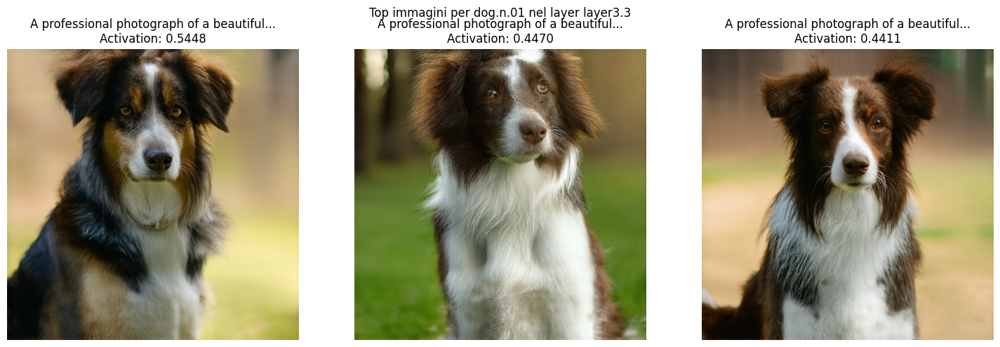


🔍 Analisi: layer3.3 – Synset: flower.n.01


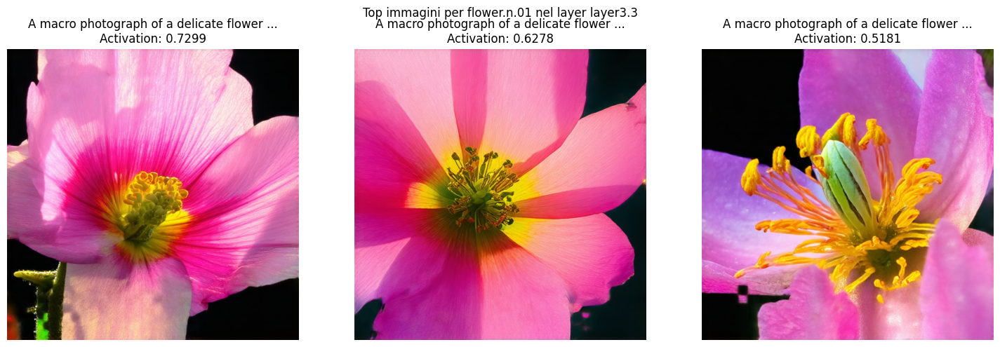


🔍 Analisi: layer4.0.bn1 – Synset: dog.n.01


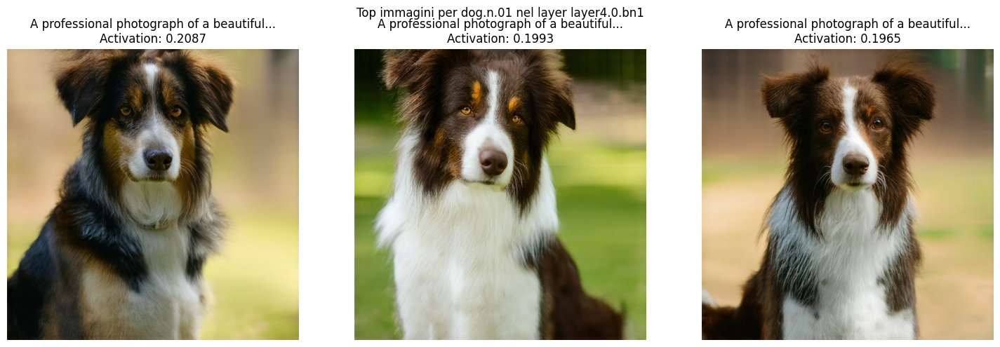


🔍 Analisi: layer4.0.bn1 – Synset: cat.n.01


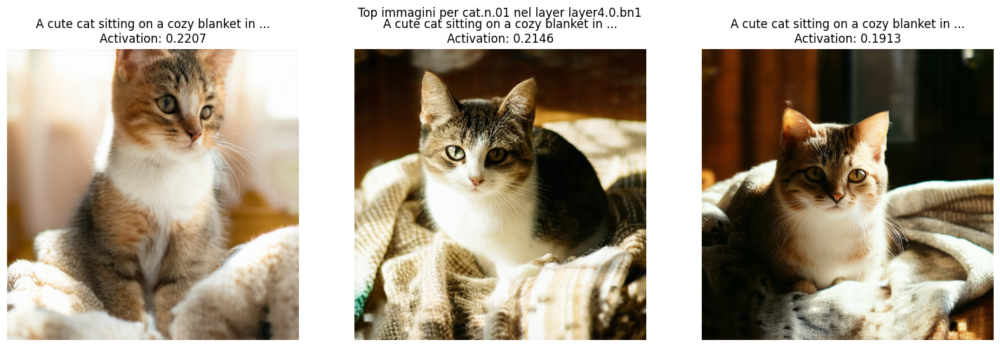


🔍 Analisi: layer4.0.bn1 – Synset: flower.n.01


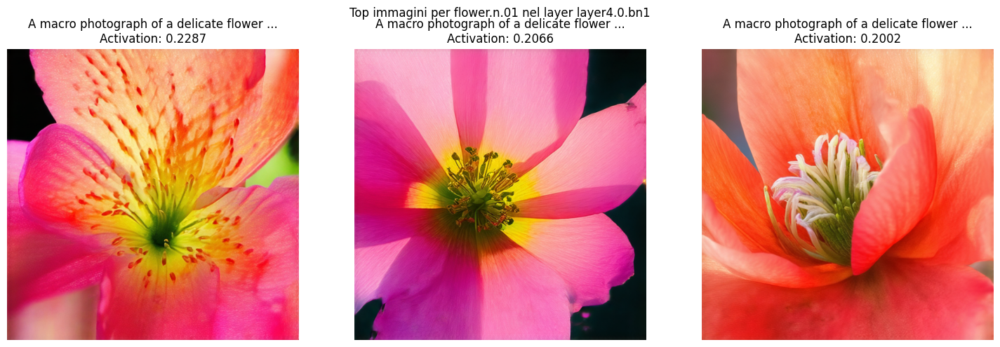

Hooks rimossi!
Cleanup completato


In [15]:
def main():
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()

    project = CNNInterpretabilityProject()
    project.setup()

    print("\n🎨 Prompt dettagliati che verranno usati:")
    print("=" * 80)
    for idx, prompt in enumerate(project.prompts, start=1):
        print(f"{idx}. {prompt}")
    print("=" * 80)

    project.run_experiment()
    project.visualize_generated_images()
    project.generate_report()
    project.quantitative_evaluation()

    top_layer_data = project.get_top_synsets_per_layer(top_n=3)
    for idx, (layer_name, synsets) in enumerate(top_layer_data.items()):
        if idx >= 2:
            break
        for synset_name, _, _ in synsets:
            print(f"\n🔍 Analisi: {layer_name} – Synset: {synset_name}")
            project.visualize_top_activating_images(layer_name, synset_name, max_images=3)

    project.cleanup()

if __name__ == '__main__':
    main()